# Atividade A

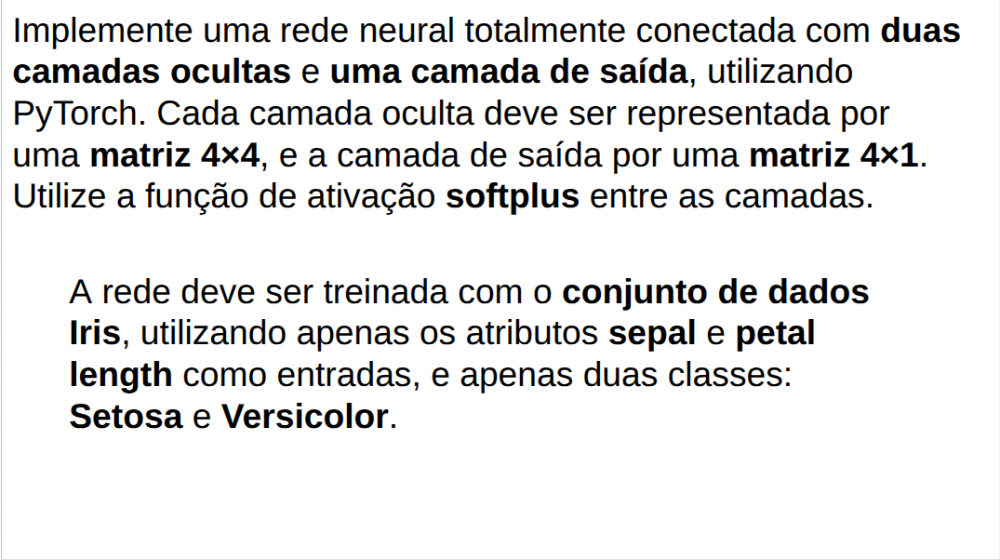

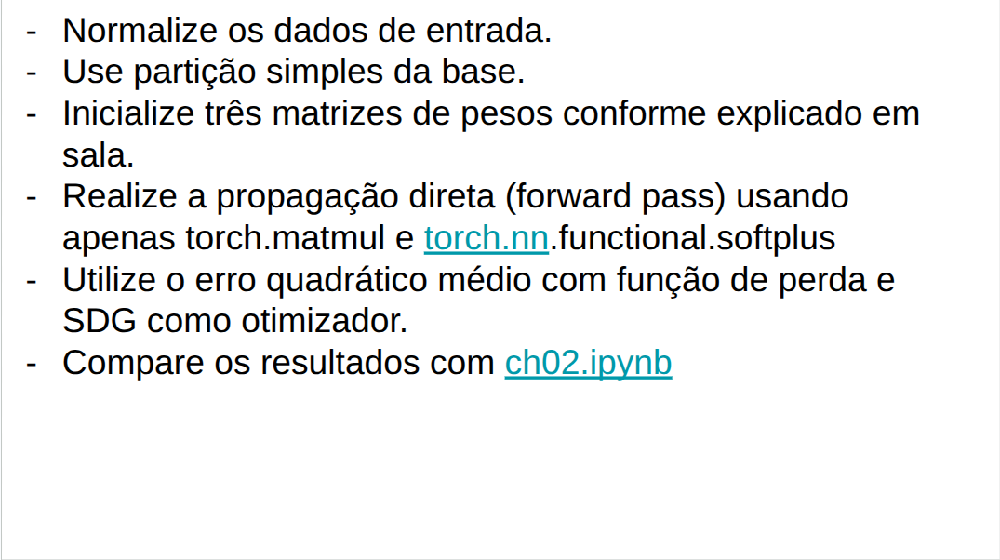

In [1]:
from IPython.display import Image, display

# Exibe a primeira imagem com largura ajustada
display(Image("/home/cassiosilva/Imagens/Tarefa 3.1/Atividade A_1.png", width=950))
print("")  # Espaço entre as imagens

# Exibe a segunda imagem com largura ajustada
display(Image("/home/cassiosilva/Imagens/Tarefa 3.1/Atividade A_2.png", width=950))
print("")  # Espaço entre as imagens

In [63]:
import torch
import torch.nn.functional as F
from sklearn import datasets
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [64]:
# 1. Carregar dataset Iris
iris = datasets.load_iris()
X = iris.data[:, [0, 2]]  # sepal length e petal length
y = iris.target

# 2. Filtrar apenas Setosa (0) e Versicolor (1)
mask = y < 2
X = X[mask]
y = y[mask]

# 3. Normalizar os dados
scaler = StandardScaler()
X = scaler.fit_transform(X)

# 4. Dividir em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 5. Converter para tensores
X_train = torch.tensor(X_train, dtype=torch.float32)
y_train = torch.tensor(y_train.reshape(-1, 1), dtype=torch.float32)

# 6. Inicializar pesos com gradientes
torch.manual_seed(0)
w1 = torch.randn(2, 4, requires_grad=True)
w2 = torch.randn(4, 4, requires_grad=True)
w3 = torch.randn(4, 1, requires_grad=True)

# 6. Inicializar bias com gradientes
b1 = torch.randn(4, requires_grad=True)  # bias para primeira camada
b2 = torch.randn(4, requires_grad=True)  # bias para segunda camada 
b3 = torch.randn(1, requires_grad=True)  # bias para camada de saída

# 7. Definir otimizador e função de perda
optimizer = torch.optim.SGD([w1, w2, w3, b1, b2, b3], lr=0.1)
loss_fn = torch.nn.MSELoss()

# 8. Loop de treino
for epoch in range(300):
    # Forward manual
    z1 = torch.matmul(X_train, w1) + b1
    a1 = F.softplus(z1)
    z2 = torch.matmul(a1, w2) + b2
    a2 = F.softplus(z2)
    z3 = torch.matmul(a2, w3) + b3
    y_pred = torch.sigmoid(z3)

    # Loss (Erro Quadrático Médio)
    loss = loss_fn(y_pred, y_train)

    # Backpropagation
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    # Monitorar
    if epoch % 10 == 0:
        acc = ((y_pred > 0.5).float() == y_train).float().mean()
        print(f"Epoch {epoch:4d} | Loss: {loss.item():.4f} | Acurácia: {acc:.4f}")

# 9. Avaliação final
with torch.no_grad():
    z1 = torch.matmul(X_train, w1)
    a1 = F.softplus(z1)
    z2 = torch.matmul(a1, w2)
    a2 = F.softplus(z2)
    z3 = torch.matmul(a2, w3)
    y_pred = torch.sigmoid(z3)
    acc = ((y_pred > 0.5).float() == y_train).float().mean()
    print(f"\nAcurácia final no treino: {acc:.4f}")
    print(f"Parametros finais: w1: {w1}\n w2: {w2}\n w3: {w3}\n b1: {b1}\n b2: {b2}\n b3: {b3}")


Epoch    0 | Loss: 0.4792 | Acurácia: 0.4750
Epoch   10 | Loss: 0.3531 | Acurácia: 0.4750
Epoch   20 | Loss: 0.0826 | Acurácia: 0.9000
Epoch   30 | Loss: 0.0389 | Acurácia: 0.9500
Epoch   40 | Loss: 0.0224 | Acurácia: 0.9625
Epoch   50 | Loss: 0.0136 | Acurácia: 0.9875
Epoch   60 | Loss: 0.0089 | Acurácia: 0.9875
Epoch   70 | Loss: 0.0063 | Acurácia: 1.0000
Epoch   80 | Loss: 0.0047 | Acurácia: 1.0000
Epoch   90 | Loss: 0.0038 | Acurácia: 1.0000
Epoch  100 | Loss: 0.0032 | Acurácia: 1.0000
Epoch  110 | Loss: 0.0028 | Acurácia: 1.0000
Epoch  120 | Loss: 0.0025 | Acurácia: 1.0000
Epoch  130 | Loss: 0.0023 | Acurácia: 1.0000
Epoch  140 | Loss: 0.0021 | Acurácia: 1.0000
Epoch  150 | Loss: 0.0020 | Acurácia: 1.0000
Epoch  160 | Loss: 0.0019 | Acurácia: 1.0000
Epoch  170 | Loss: 0.0018 | Acurácia: 1.0000
Epoch  180 | Loss: 0.0017 | Acurácia: 1.0000
Epoch  190 | Loss: 0.0016 | Acurácia: 1.0000
Epoch  200 | Loss: 0.0016 | Acurácia: 1.0000
Epoch  210 | Loss: 0.0015 | Acurácia: 1.0000
Epoch  220

### Conclusão
Conforme solicitado no enunciado da questão, a rede neural foi construída do zero. É possível observar na saída que a rede atingiu os melhores parâmetros entre as épocas 60 e 70. No entanto, como não foi definida uma condição de parada antecipada, o treinamento prosseguiu até a última época (300), conforme configurado nos hiperparâmetros.

# Atividade B

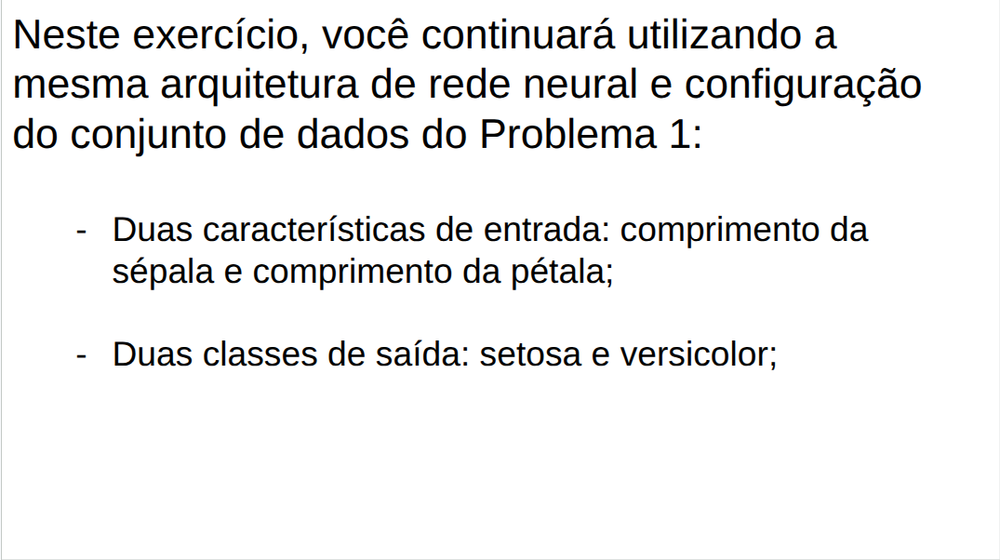

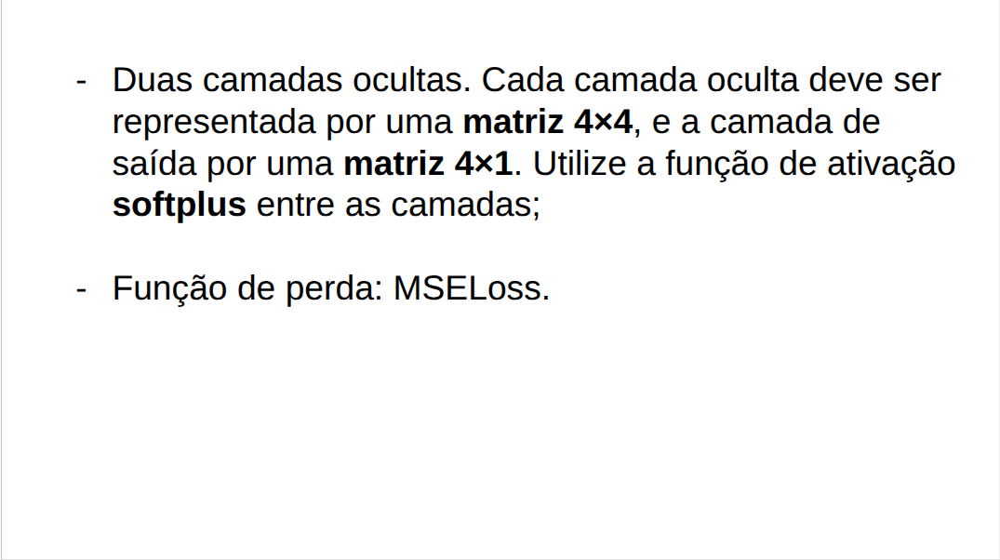

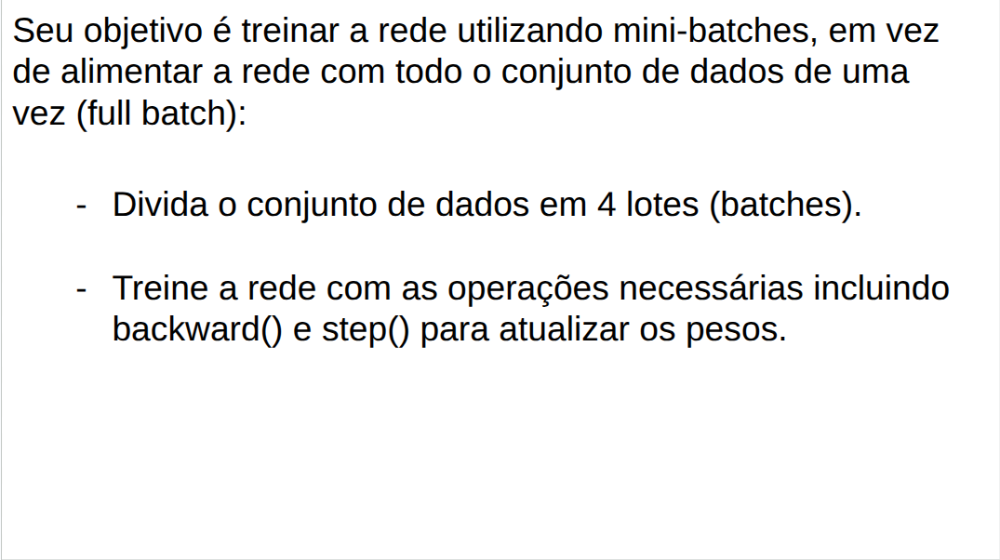

In [3]:
from IPython.display import Image, display

# Exibe a primeira imagem com largura ajustada
display(Image("/home/cassiosilva/Imagens/Tarefa 3.1/Atividade B_1.png", width=950))
print("")  # Espaço entre as imagens

# Exibe a segunda imagem com largura ajustada
display(Image("/home/cassiosilva/Imagens/Tarefa 3.1/Atividade B_2.png", width=950))
print("")  # Espaço entre as imagens

# Exibe a segunda imagem com largura ajustada
display(Image("/home/cassiosilva/Imagens/Tarefa 3.1/Atividade B_3.png", width=950))
print("")  # Espaço entre as imagens

In [13]:
import torch
import torch.nn.functional as F
from sklearn import datasets
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset

# 1. Carregar dataset Iris
iris = datasets.load_iris()
X = iris.data[:, [0, 2]]  # sepal length e petal length
y = iris.target

# 2. Filtrar apenas Setosa (0) e Versicolor (1)
mask = y < 2
X = X[mask]
y = y[mask]

# 3. Normalizar os dados
scaler = StandardScaler()
X = scaler.fit_transform(X)

# 4. Dividir em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 5. Converter para tensores e criar DataLoader
X_train = torch.tensor(X_train, dtype=torch.float32)
y_train = torch.tensor(y_train.reshape(-1, 1), dtype=torch.float32)

# Criar Dataset e DataLoader para mini-batches
batch_size = 4
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# 6. Inicializar pesos com gradientes
torch.manual_seed(0)
w1 = torch.randn(2, 4, requires_grad=True)
w2 = torch.randn(4, 4, requires_grad=True)
w3 = torch.randn(4, 1, requires_grad=True)

# 6. Inicializar bias com gradientes
b1 = torch.randn(4, requires_grad=True)  # bias para primeira camada
b2 = torch.randn(4, requires_grad=True)  # bias para segunda camada 
b3 = torch.randn(1, requires_grad=True)  # bias para camada de saída

# 7. Definir otimizador e função de perda
optimizer = torch.optim.SGD([w1, w2, w3, b1, b2, b3], lr=0.1)
loss_fn = torch.nn.MSELoss()

# 8. Loop de treino com mini-batches
for epoch in range(300):
    epoch_loss = 0.0
    correct = 0
    total = 0
    
    for batch_X, batch_y in train_loader:
        # Forward manual
        z1 = torch.matmul(batch_X, w1) + b1
        a1 = F.softplus(z1)
        z2 = torch.matmul(a1, w2) + b2
        a2 = F.softplus(z2)
        z3 = torch.matmul(a2, w3) + b3
        batch_pred = torch.sigmoid(z3)

        # Loss (Erro Quadrático Médio)
        loss = loss_fn(batch_pred, batch_y)

        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        # Acumular estatísticas
        epoch_loss += loss.item()
        correct += ((batch_pred > 0.5).float() == batch_y).float().sum()
        total += batch_y.size(0)
    
    # Monitorar
    if epoch % 10 == 0:
        avg_loss = epoch_loss / len(train_loader)
        acc = correct / total
        print(f"Epoch {epoch:4d} | Loss: {avg_loss:.4f} | Acurácia: {acc:.4f}")

# 9. Avaliação final em todos os dados de treino
with torch.no_grad():
    z1 = torch.matmul(X_train, w1) + b1
    a1 = F.softplus(z1)
    z2 = torch.matmul(a1, w2) + b2
    a2 = F.softplus(z2)
    z3 = torch.matmul(a2, w3) + b3
    y_pred = torch.sigmoid(z3)
    acc = ((y_pred > 0.5).float() == y_train).float().mean()
    print(f"\nAcurácia final no treino: {acc:.4f}")
    print(f"Parametros finais: w1: {w1}\n w2: {w2}\n w3: {w3}\n b1: {b1}\n b2: {b2}\n b3: {b3}")

Epoch    0 | Loss: 0.3344 | Acurácia: 0.5750
Epoch   10 | Loss: 0.0016 | Acurácia: 1.0000
Epoch   20 | Loss: 0.0009 | Acurácia: 1.0000
Epoch   30 | Loss: 0.0007 | Acurácia: 1.0000
Epoch   40 | Loss: 0.0005 | Acurácia: 1.0000
Epoch   50 | Loss: 0.0004 | Acurácia: 1.0000
Epoch   60 | Loss: 0.0003 | Acurácia: 1.0000
Epoch   70 | Loss: 0.0003 | Acurácia: 1.0000
Epoch   80 | Loss: 0.0002 | Acurácia: 1.0000
Epoch   90 | Loss: 0.0002 | Acurácia: 1.0000
Epoch  100 | Loss: 0.0002 | Acurácia: 1.0000
Epoch  110 | Loss: 0.0002 | Acurácia: 1.0000
Epoch  120 | Loss: 0.0001 | Acurácia: 1.0000
Epoch  130 | Loss: 0.0001 | Acurácia: 1.0000
Epoch  140 | Loss: 0.0001 | Acurácia: 1.0000
Epoch  150 | Loss: 0.0001 | Acurácia: 1.0000
Epoch  160 | Loss: 0.0001 | Acurácia: 1.0000
Epoch  170 | Loss: 0.0001 | Acurácia: 1.0000
Epoch  180 | Loss: 0.0001 | Acurácia: 1.0000
Epoch  190 | Loss: 0.0001 | Acurácia: 1.0000
Epoch  200 | Loss: 0.0001 | Acurácia: 1.0000
Epoch  210 | Loss: 0.0001 | Acurácia: 1.0000
Epoch  220

### Conclusão

Nesta versão, a rede neural foi treinada com a técnica de **mini-batches**, utilizando a mesma configuração da questão anterior. Essa abordagem, que atualiza os pesos com pequenos subconjuntos dos dados, mostrou-se eficiente: a rede atingiu bons resultados já nas primeiras 10 épocas. Isso evidencia que o uso de mini-batches contribuiu para uma convergência mais rápida e eficaz.

# Atividade C

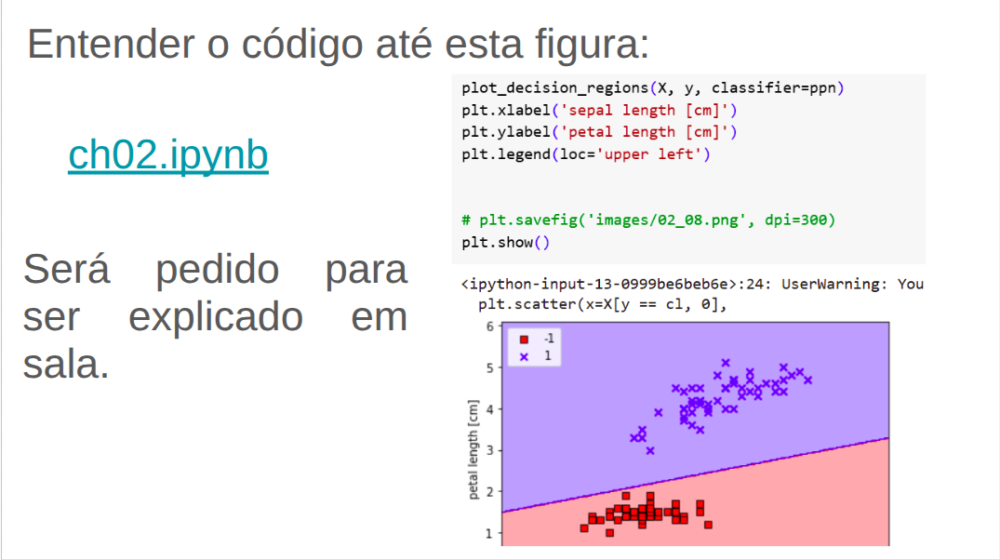

In [4]:
# Exibe a segunda imagem com largura ajustada
display(Image("/home/cassiosilva/Imagens/Tarefa 3.1/Atividade C.png", width=950))
print("")  # Espaço entre as imagens

### 🧠 Comparação entre Neurônio Biológico e Neurônio Artificial

Este código traça uma analogia entre os **neurônios biológicos** e os **neurônios artificiais** utilizados em algoritmos de aprendizado de máquina, como o **Perceptron**.

---

#### 🧬 Neurônio Biológico

- **Dendritos**: recebem múltiplos sinais de entrada.
- **Corpo celular (núcleo)**: integra os sinais recebidos.
- **Axônio**: transmite o sinal processado.
- **Bainha de mielina**: acelera a condução do impulso elétrico.
- **Terminais do axônio**: enviam o sinal para outros neurônios.
- O neurônio "dispara" se a soma dos sinais ultrapassar um determinado **limiar**.

---

#### 🤖 Neurônio Artificial (Perceptron)

Inspirado nos estudos de **McCulloch e Pitts**, o Perceptron funciona como um classificador binário simples:

- Cada entrada `x_i` possui um **peso associado** `w_i`.
- Calcula-se a **entrada líquida**:  
  $$
  z = \mathbf{w}^T \mathbf{x} + b
  $$
- A entrada líquida é passada por uma **função de ativação** degrau:
  $$
  \text{output} = 
  \begin{cases}
    1, & \text{se } z \geq 0 \\
    0, & \text{caso contrário}
  \end{cases}
  $$

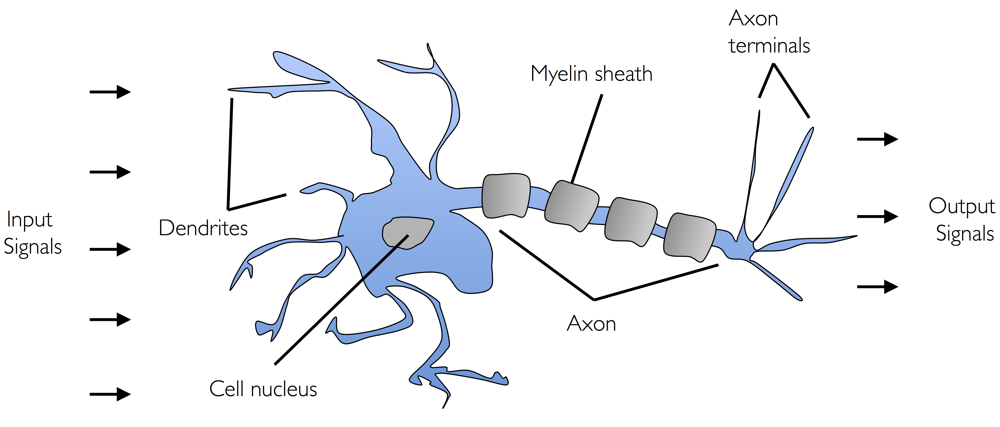

In [47]:
# Exibe a segunda imagem com largura ajustada
display(Image("/home/cassiosilva/Área de trabalho/download (2).png", width=950))
##print("")  # Espaço entre as imagens


#### 📌 Interpretação da Figura

- A **subfigura da esquerda** mostra como o valor da entrada líquida `z` é comprimido em uma saída binária (0 ou 1) pela função de decisão do perceptron.
- A **subfigura da direita** mostra como essa função pode ser utilizada para separar duas classes **linearmente separáveis** por meio de uma **fronteira de decisão linear**.

Essa separação simples é o fundamento de redes neurais mais complexas. Quando as classes não são linearmente separáveis, outras técnicas e arquiteturas mais avançadas são necessárias.

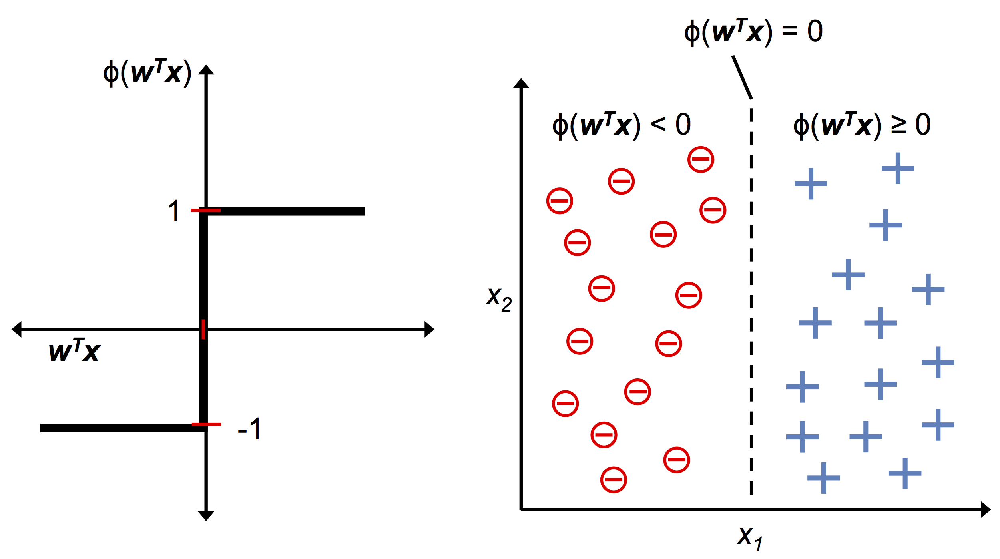

In [48]:
# Exibe a segunda imagem com largura ajustada
display(Image("/home/cassiosilva/Área de trabalho/download (3).png", width=950))

### 🧠 Perceptron e Separabilidade Linear

O perceptron é um dos algoritmos mais simples e fundamentais de aprendizado supervisionado. Ele foi projetado para resolver **problemas de classificação binária**, atualizando iterativamente os pesos com base em erros de classificação.

---

### ⚠️ Convergência do Perceptron

A **convergência** do algoritmo perceptron só é garantida **se as classes forem linearmente separáveis**, ou seja, se for possível traçar uma linha reta (ou um hiperplano, em dimensões maiores) que separe perfeitamente as amostras das duas classes.

Caso contrário, o algoritmo pode **nunca parar de ajustar os pesos**, pois sempre haverá erros residuais. Nesses cenários, é necessário definir um:

- **Número máximo de épocas** (iterações sobre os dados);
- **Limite de erros tolerados**.

---

### 📊 Ilustração Visual:

A imagem abaixo mostra três cenários:

1. **Linearly separable**  
   As classes podem ser separadas com uma única linha de decisão linear (ex: `wᵀx + b = 0`).
   
2. **Not linearly separable (sobreposição simples)**  
   As classes estão misturadas, sem possibilidade de separação linear perfeita.
   
3. **Not linearly separable (totalmente embaralhadas)**  
   As classes estão completamente entrelaçadas, exigindo métodos não-lineares.


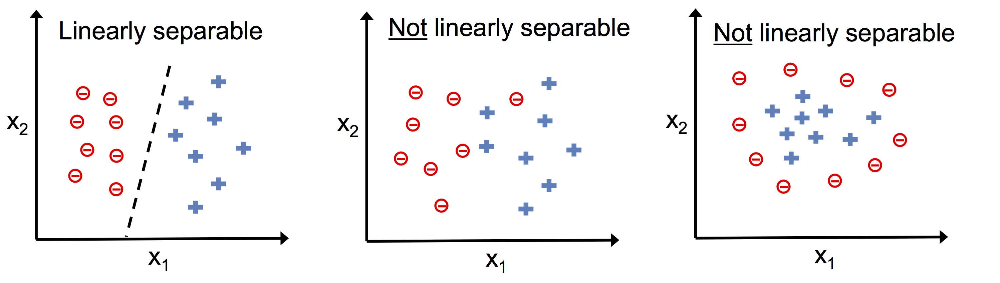

In [49]:
# Exibe a segunda imagem com largura ajustada
display(Image("/home/cassiosilva/Área de trabalho/download (4).png", width=950))

### 🧩 Funcionamento do Perceptron


### 📌 Etapas do Processo

1. **Entradas (`x₁`, `x₂`, ..., `xₘ`)**  
   Cada entrada do vetor de características é multiplicada pelo seu peso correspondente (`w₁`, `w₂`, ..., `wₘ`). Também é adicionada uma unidade de viés (bias), multiplicada por `w₀`.

2. **Função de entrada líquida (`net input`)**  
   A soma ponderada das entradas é calculada:
   $$
   z = w_0 \cdot 1 + w_1x_1 + w_2x_2 + \dots + w_mx_m = \mathbf{w}^\top \mathbf{x} + b
   $$

3. **Função de ativação (limiar)**  
   A entrada líquida `z` é passada por uma **função de limiar**, que produz uma saída binária:
   $$
   \text{output} =
   \begin{cases}
     1 & \text{se } z \geq 0 \\
     0 & \text{caso contrário}
   \end{cases}
   $$

4. **Cálculo do erro**  
   A saída gerada é comparada com o rótulo verdadeiro (`y`). A diferença entre ambos é o **erro** da predição.

5. **Atualização dos pesos**  
   Se houver erro, os pesos são ajustados:
   $$
   \mathbf{w} := \mathbf{w} + \eta (y - \hat{y}) \mathbf{x}
   $$
   onde `η` é a taxa de aprendizado.


Este diagrama resume a essência do perceptron: um modelo simples de rede neural que aprende ajustando seus pesos com base nos erros de classificação. Seu poder está na capacidade de aprender fronteiras de decisão **lineares**, sendo a base conceitual para redes neurais mais complexas.

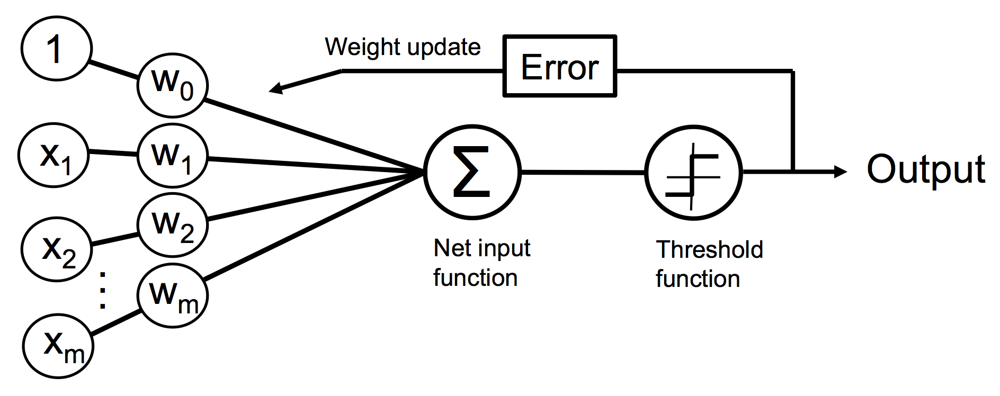

In [50]:
# Exibe a segunda imagem com largura ajustada
display(Image("/home/cassiosilva/Área de trabalho/download (5).png", width=950))

### 🧠 Classificação com Perceptron no Dataset Iris (Setosa vs Versicolor)

Este notebook executa um experimento de classificação binária usando o algoritmo **Perceptron** sobre um subconjunto do **dataset Iris**, focando em duas classes e duas features.

---

### 📥 1. Carregamento do Dataset

Os dados são carregados diretamente do repositório da UCI.

```python
df = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/iris/iris.data', header=None)
```

---

### 🧪 2. Seleção de Classes e Atributos
Selecionamos somente 2 classes (as 100 primeiras amostras):

- Iris-setosa → será rotulada como -1

- Iris-versicolor → será rotulada como +1

Também selecionamos apenas duas features:

- Comprimento da sépala (sepal length, coluna 0)

- Comprimento da pétala (petal length, coluna 2)

```python
y = df.iloc[0:100, 4].values
y = np.where(y == 'Iris-setosa', -1, 1)
X = df.iloc[0:100, [0, 2]].values
```

---

### 📊 3. Visualização dos Dados
Os dados são representados com dois tipos de marcadores:

- Iris-setosa: marcadores vermelhos circulares

- Iris-versicolor: marcadores azuis em X

```python
plt.scatter(X[:50, 0], X[:50, 1], color='red', marker='o', label='setosa')
plt.scatter(X[50:100, 0], X[50:100, 1], color='blue', marker='x', label='versicolor')
```

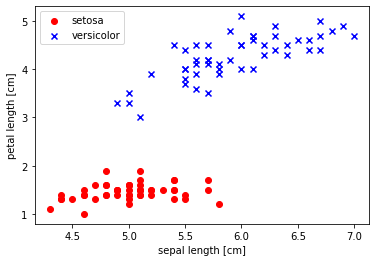

In [52]:
# Exibe a segunda imagem com largura ajustada
display(Image("/home/cassiosilva/Área de trabalho/download (6).png", width=950))



### 🤖 4. Treinamento do Perceptron
O Perceptron é instanciado com os seguintes parâmetros:

- Taxa de aprendizado (eta) = 0.1

- Número de épocas (n_iter) = 10

```python
ppn = Perceptron(eta=0.1, n_iter=10)
ppn.fit(X, y)
```
Durante o treinamento, o modelo ajusta os pesos a cada erro de classificação.

---

### 📈 5. Erros por Época
O gráfico a seguir mostra o número de erros de classificação por época, o que indica o progresso do aprendizado do Perceptron.

```python
plt.plot(range(1, len(ppn.errors_) + 1), ppn.errors_, marker='o')
plt.xlabel('Epochs')
plt.ylabel('Number of updates')
```

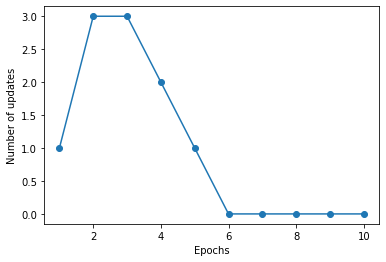

In [53]:
# Exibe a segunda imagem com largura ajustada
display(Image("/home/cassiosilva/Área de trabalho/download (7).png", width=950))

---

### 🧩 6. Função para Plotar a Região de Decisão
A função plot_decision_regions() cria uma visualização que mostra:

- As regiões do espaço onde o Perceptron classifica como uma ou outra classe

- As fronteiras de decisão

- Os pontos reais com suas classes verdadeiras

Ela faz isso por:

- Criação de uma malha (np.meshgrid)

- Previsão dos valores com classifier.predict()

- Preenchimento da área com contourf

---

### 🖼️ 7. Visualização Final
Por fim, plota-se a fronteira de decisão junto aos dados reais para avaliar a performance do classificador:

```python
plot_decision_regions(X, y, classifier=ppn)
plt.xlabel('sepal length [cm]')
plt.ylabel('petal length [cm]')
plt.legend(loc='upper left')
```

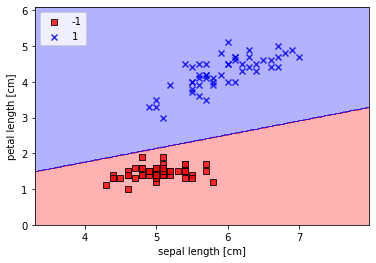

In [54]:
# Exibe a segunda imagem com largura ajustada
display(Image("/home/cassiosilva/Área de trabalho/download (8).png", width=950))

### Conclusão
Este experimento demonstra a aplicação do algoritmo Perceptron em um problema de classificação binária com classes linearmente separáveis. O modelo ajusta seus pesos com base nos erros de classificação e, nesse contexto, apresenta convergência rápida, como observado no subconjunto do conjunto Iris.

Além disso, o experimento ilustra visualmente a evolução da fronteira de decisão linear, reforçando o fato de que a convergência do Perceptron só é garantida quando os dados são separáveis linearmente. Em casos em que isso não ocorre, o modelo pode não convergir, exigindo a definição de critérios de parada, como número máximo de épocas ou tolerância a erros.

# Atividade D

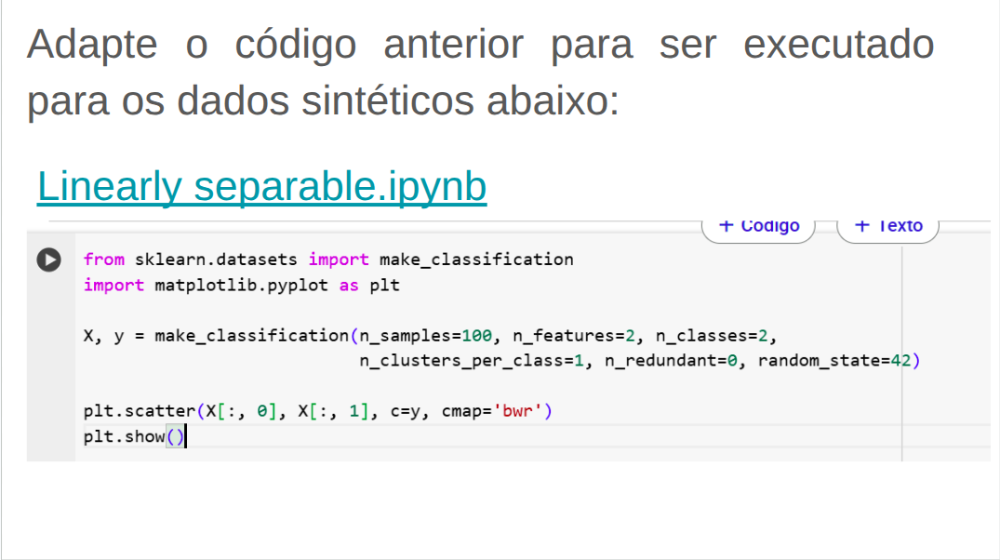

In [5]:
# Exibe a segunda imagem com largura ajustada
display(Image("/home/cassiosilva/Imagens/Tarefa 3.1/Atividade D.png", width=950))
print("")  # Espaço entre as imagens

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification
from matplotlib.colors import ListedColormap

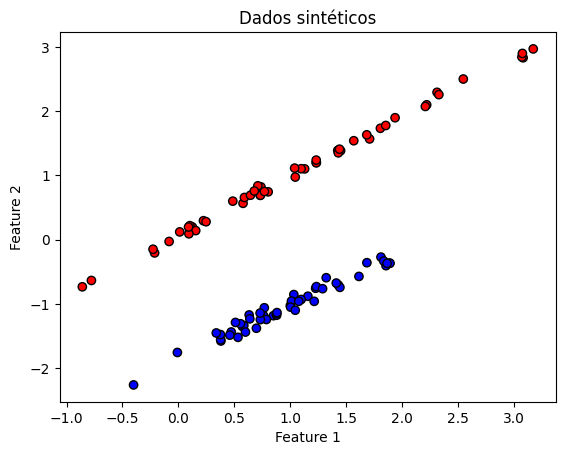

In [43]:
# Gerar dados sintéticos
X, y = make_classification(n_samples=100, n_features=2, n_classes=2,
                           n_clusters_per_class=1, n_redundant=0, random_state=42)

# Ajustar rótulos para -1 e 1 (como esperado pelo Perceptron)
y = np.where(y == 0, -1, 1)

# Visualizar os dados
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='bwr', edgecolor='k')
plt.title("Dados sintéticos")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()

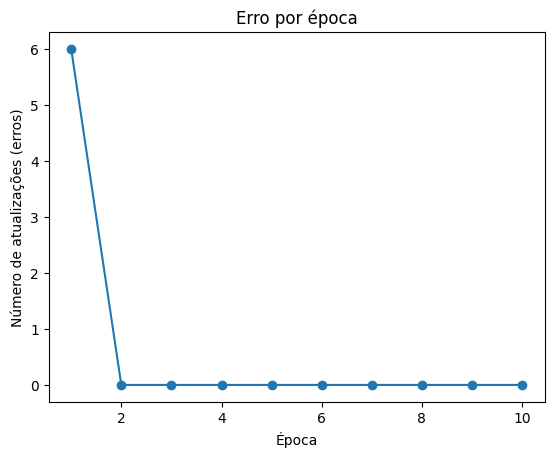

In [41]:
# --- Perceptron simples ---
class Perceptron:
    def __init__(self, eta=0.01, n_iter=10):
        self.eta = eta
        self.n_iter = n_iter

    def fit(self, X, y):
        self.weights_ = np.zeros(1 + X.shape[1])
        self.errors_ = []

        for _ in range(self.n_iter):
            errors = 0
            for xi, target in zip(X, y):
                update = self.eta * (target - self.predict(xi))
                self.weights_[1:] += update * xi
                self.weights_[0] += update
                errors += int(update != 0.0)
            self.errors_.append(errors)
        return self

    def net_input(self, X):
        return np.dot(X, self.weights_[1:]) + self.weights_[0]

    def predict(self, X):
        return np.where(self.net_input(X) >= 0.0, 1, -1)

# Treinar o modelo
ppn = Perceptron(eta=0.1, n_iter=10)
ppn.fit(X, y)

# Plotar número de erros por época
plt.plot(range(1, len(ppn.errors_) + 1), ppn.errors_, marker='o')
plt.xlabel('Época')
plt.ylabel('Número de atualizações (erros)')
plt.title('Erro por época')
plt.show()

/tmp/ipykernel_14938/3175862665.py:26: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(x=X[y == cl, 0],


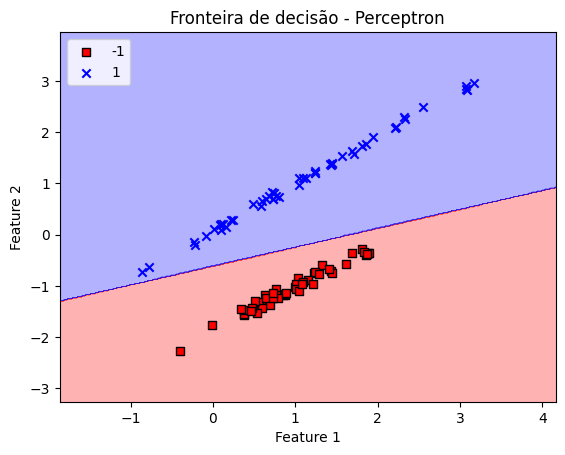

In [44]:
# --- Plotar regiões de decisão ---
def plot_decision_regions(X, y, classifier, resolution=0.02):
    markers = ('s', 'x')
    colors = ('red', 'blue')
    cmap = ListedColormap(colors[:len(np.unique(y))])

    # Limites
    x1_min, x1_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    x2_min, x2_max = X[:, 1].min() - 1, X[:, 1].max() + 1

    # Malha
    xx1, xx2 = np.meshgrid(np.arange(x1_min, x1_max, resolution),
                           np.arange(x2_min, x2_max, resolution))

    # Previsões
    Z = classifier.predict(np.array([xx1.ravel(), xx2.ravel()]).T)
    Z = Z.reshape(xx1.shape)

    # Contorno
    plt.contourf(xx1, xx2, Z, alpha=0.3, cmap=cmap)
    plt.xlim(xx1.min(), xx1.max())
    plt.ylim(xx2.min(), xx2.max())

    # Dados
    for idx, cl in enumerate(np.unique(y)):
        plt.scatter(x=X[y == cl, 0],
                    y=X[y == cl, 1],
                    c=colors[idx],
                    label=cl,
                    marker=markers[idx],
                    edgecolor='black')

# Mostrar regiões de decisão
plot_decision_regions(X, y, classifier=ppn)
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Fronteira de decisão - Perceptron')
plt.legend(loc='upper left')
plt.show()

### Conclusão

O experimento demonstrou o funcionamento do Perceptron em dados linearmente separáveis, com implementação feita do zero. O número de erros caiu rapidamente entre as épocas 2 e 4, indicando convergência. A visualização da fronteira de decisão confirmou a separação clara entre as classes.

# Atividade E

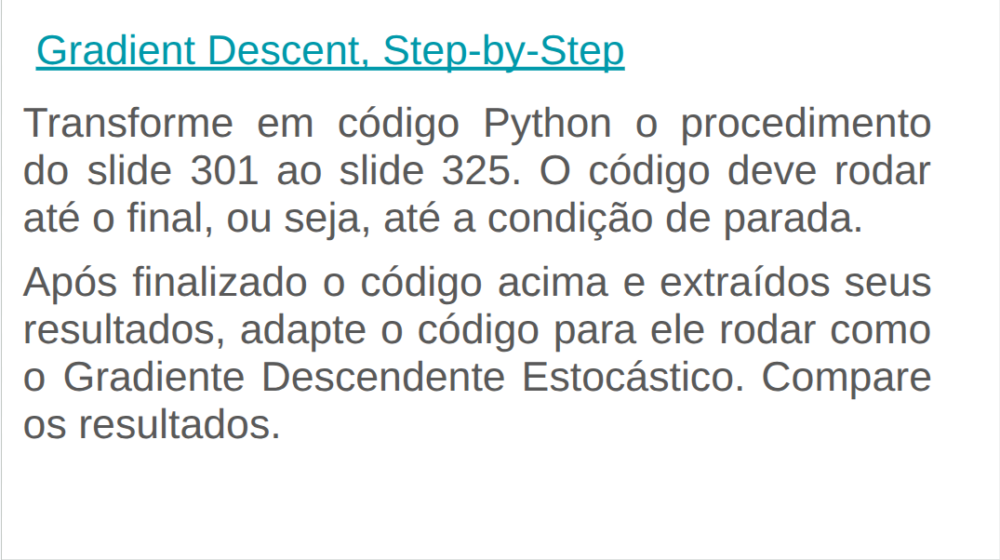

In [6]:
# Exibe a segunda imagem com largura ajustada
display(Image("/home/cassiosilva/Imagens/Tarefa 3.1/Atividade E.png", width=950))
print("")  # Espaço entre as imagens

In [37]:
import numpy as np

# Dados
X = np.array([0.5, 2.3, 2.9])
y = np.array([1.4, 1.9, 3.2])

# Inicialização
w = 1.0
b = 0.0
learning_rate = 0.01
tolerance = 0.0001
max_epochs = 10000

print(f"Inicialização: inclinação = {w}, interceptação = {b}")

for epoch in range(max_epochs):
    # Previsões
    y_pred = w * X + b
    errors = y - y_pred

    # Gradientes
    dSSR_intercept = -2 * np.sum(errors)
    dSSR_slope = -2 * np.sum(errors * X)

    # Passos
    stepSize_intercept = learning_rate * dSSR_intercept
    stepSize_slope = learning_rate * dSSR_slope

    # Atualizações
    b -= stepSize_intercept
    w -= stepSize_slope

    print(f"\nÉpoca: {epoch}")
    print(f"Gradientes → interceptação: {dSSR_intercept:.4f}, inclinação: {dSSR_slope:.4f}")
    print(f"Passos     → interceptação: {stepSize_intercept:.4f}, inclinação: {stepSize_slope:.4f}")
    print(f"Atualizado → interceptação: {b:.4f}, inclinação: {w:.4f}")

    # Condição de parada
    if abs(stepSize_intercept) < tolerance and abs(stepSize_slope) < tolerance:
        print("\n✅ Convergência atingida!")
        break

# Resultado final
print(f"\n🔚 Parâmetros finais:")
print(f"Inclinação (w): {w:.2f}")
print(f"Interceptação (b): {b:.2f}")


Inicialização: inclinação = 1.0, interceptação = 0.0

Época: 0
Gradientes → interceptação: -1.6000, inclinação: -0.8000
Passos     → interceptação: -0.0160, inclinação: -0.0080
Atualizado → interceptação: 0.0160, inclinação: 1.0080

Época: 1
Gradientes → interceptação: -1.4128, inclinação: -0.3944
Passos     → interceptação: -0.0141, inclinação: -0.0039
Atualizado → interceptação: 0.0301, inclinação: 1.0119

Época: 2
Gradientes → interceptação: -1.2831, inclinação: -0.1233
Passos     → interceptação: -0.0128, inclinação: -0.0012
Atualizado → interceptação: 0.0430, inclinação: 1.0132

Época: 3
Gradientes → interceptação: -1.1920, inclinação: 0.0574
Passos     → interceptação: -0.0119, inclinação: 0.0006
Atualizado → interceptação: 0.0549, inclinação: 1.0126

Época: 4
Gradientes → interceptação: -1.1270, inclinação: 0.1773
Passos     → interceptação: -0.0113, inclinação: 0.0018
Atualizado → interceptação: 0.0661, inclinação: 1.0108

Época: 5
Gradientes → interceptação: -1.0796, inclinaçã

In [38]:
import numpy as np

# Dados
X = np.array([0.5, 2.3, 2.9])
y = np.array([1.4, 1.9, 3.2])

# Inicialização
w = 1.0
b = 0.0
learning_rate = 0.01
tolerance = 0.0001
max_epochs = 10000

print(f"Inicialização: inclinação = {w}, interceptação = {b}")

for epoch in range(max_epochs):
    convergiu = True  # Assumimos convergência, testaremos abaixo
    
    for i in range(len(X)):
        xi = X[i]
        yi = y[i]

        # Previsão para o ponto i
        y_pred = w * xi + b
        error = yi - y_pred

        # Gradientes (derivadas da SSR)
        dSSR_w = -2 * xi * error
        dSSR_b = -2 * error

        # Passos
        step_w = learning_rate * dSSR_w
        step_b = learning_rate * dSSR_b

        # Atualizações
        w -= step_w
        b -= step_b

        # Verifica se algum passo ainda é significativo
        if abs(step_w) >= tolerance or abs(step_b) >= tolerance:
            convergiu = False

        print(f"\nÉpoca {epoch} - Amostra {i}:")
        print(f"xi = {xi:.2f}, yi = {yi:.2f}, erro = {error:.4f}")
        print(f"Gradientes → dw = {dSSR_w:.4f}, db = {dSSR_b:.4f}")
        print(f"Passos     → step_w = {step_w:.4f}, step_b = {step_b:.4f}")
        print(f"Parâmetros → w = {w:.4f}, b = {b:.4f}")

    if convergiu:
        print(f"\n✅ Convergência atingida na época {epoch}.")
        break

# Resultado final
print(f"\n🔚 Parâmetros finais:")
print(f"Inclinação (w): {w:.2f}")
print(f"Interceptação (b): {b:.2f}")

Inicialização: inclinação = 1.0, interceptação = 0.0

Época 0 - Amostra 0:
xi = 0.50, yi = 1.40, erro = 0.9000
Gradientes → dw = -0.9000, db = -1.8000
Passos     → step_w = -0.0090, step_b = -0.0180
Parâmetros → w = 1.0090, b = 0.0180

Época 0 - Amostra 1:
xi = 2.30, yi = 1.90, erro = -0.4387
Gradientes → dw = 2.0180, db = 0.8774
Passos     → step_w = 0.0202, step_b = 0.0088
Parâmetros → w = 0.9888, b = 0.0092

Época 0 - Amostra 2:
xi = 2.90, yi = 3.20, erro = 0.3232
Gradientes → dw = -1.8745, db = -0.6464
Passos     → step_w = -0.0187, step_b = -0.0065
Parâmetros → w = 1.0076, b = 0.0157

Época 1 - Amostra 0:
xi = 0.50, yi = 1.40, erro = 0.8805
Gradientes → dw = -0.8805, db = -1.7611
Passos     → step_w = -0.0088, step_b = -0.0176
Parâmetros → w = 1.0164, b = 0.0333

Época 1 - Amostra 1:
xi = 2.30, yi = 1.90, erro = -0.4710
Gradientes → dw = 2.1664, db = 0.9419
Passos     → step_w = 0.0217, step_b = 0.0094
Parâmetros → w = 0.9947, b = 0.0239

Época 1 - Amostra 2:
xi = 2.90, yi = 3.20,

### Conclusão
O primeiro método atingiu a condição de parada com o valor mínimo de passo igual a 0.0001, indicando convergência eficiente. Já o segundo método executou até a última época definida (1500) sem encontrar os parâmetros ideais.

Como resultado, o primeiro método obteve uma inclinação de 0.64 e interceptação de 0.94, enquanto o segundo método resultou em uma inclinação de 0.67 e interceptação de 0.93. Em comparação com o valor de referência apresentado nos slides (0.64 e 0.95), observa-se que o primeiro método foi o que mais se aproximou do resultado ideal, demonstrando maior precisão na estimativa dos parâmetros do modelo.

# Atividade F

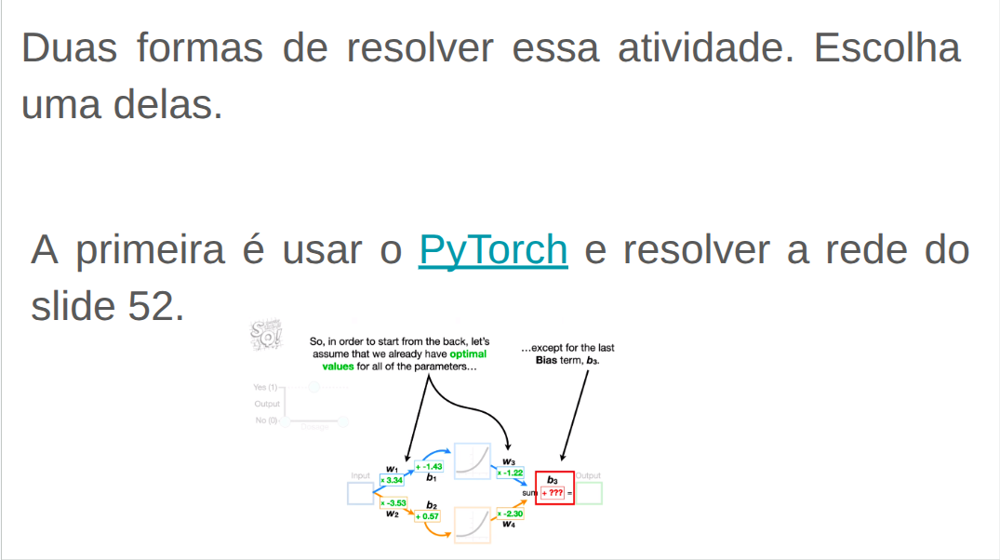

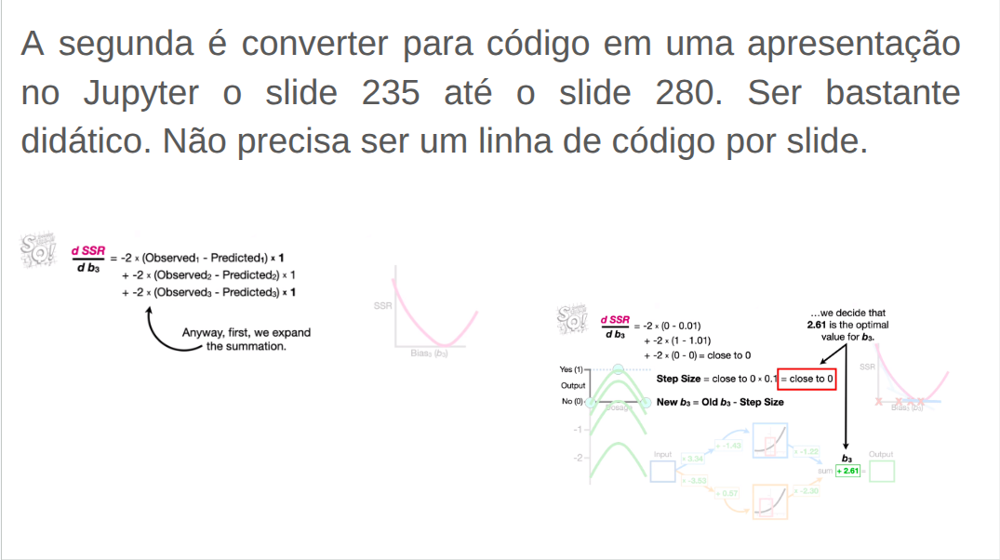

In [8]:
# Exibe a segunda imagem com largura ajustada
display(Image("/home/cassiosilva/Imagens/Tarefa 3.1/Atividade F_1.png", width=950))
print("")  # Espaço entre as imagens

# Exibe a segunda imagem com largura ajustada
display(Image("/home/cassiosilva/Imagens/Tarefa 3.1/Atividade F_2.png", width=950))
print("")  # Espaço entre as imagens


In [95]:
import torch

# Parâmetros fixos
w1 = torch.tensor(3.34)
w2 = torch.tensor(-3.53)
b1 = torch.tensor(-1.43)
b2 = torch.tensor(0.57)
w3 = torch.tensor(-1.22)
w4 = torch.tensor(-2.30)

# Inicialize b3 como um tensor com gradiente para otimização
b3 = torch.tensor(0.0, requires_grad=True)


In [96]:
def softplus(z):
    return torch.log1p(torch.exp(z))  # log(1 + exp(z))

def model(x, b3):
    z1 = w1 * x + b1
    z2 = w2 * x + b2
    a1 = softplus(z1)
    a2 = softplus(z2)
    y = w3 * a1 + w4 * a2 + b3
    return y


In [97]:
# Exemplo de dados (entrada e saída desejada)
x_data = torch.tensor([0.0, 0.5, 1.0])
y_true = torch.tensor([0.0, 1.0, 0.0])

In [98]:
criterion = torch.nn.MSELoss()
optimizer = torch.optim.SGD([b3], lr=0.01)  # otimizar somente b3

In [99]:
for epoch in range(550):
    optimizer.zero_grad()
    y_pred = model(x_data, b3)
    loss = criterion(y_pred, y_true)
    loss.backward()
    optimizer.step()

    if epoch % 50 == 0:
        print(f"Epoch {epoch}: loss={loss.item():.6f}, b3={b3.item():.2f}")

Epoch 0: loss=6.807866, b3=0.05
Epoch 50: loss=0.902874, b3=1.68
Epoch 100: loss=0.119757, b3=2.27
Epoch 150: loss=0.015900, b3=2.49
Epoch 200: loss=0.002127, b3=2.56
Epoch 250: loss=0.000300, b3=2.59
Epoch 300: loss=0.000058, b3=2.60
Epoch 350: loss=0.000026, b3=2.61
Epoch 400: loss=0.000022, b3=2.61
Epoch 450: loss=0.000021, b3=2.61
Epoch 500: loss=0.000021, b3=2.61


### conclusão
Para a resolução, foi escolhido o primeiro problema proposto. O parâmetro b3 foi otimizado e atingiu o valor de aproximadamente 2.61 entre as épocas 300 e 350, conforme discutido em sala e apresentado nos slides. Nesse ponto, o modelo obteve um erro de predição extremamente baixo, em torno de 0.000026, indicando que a rede foi capaz de se ajustar muito bem aos dados.

# Atividade G

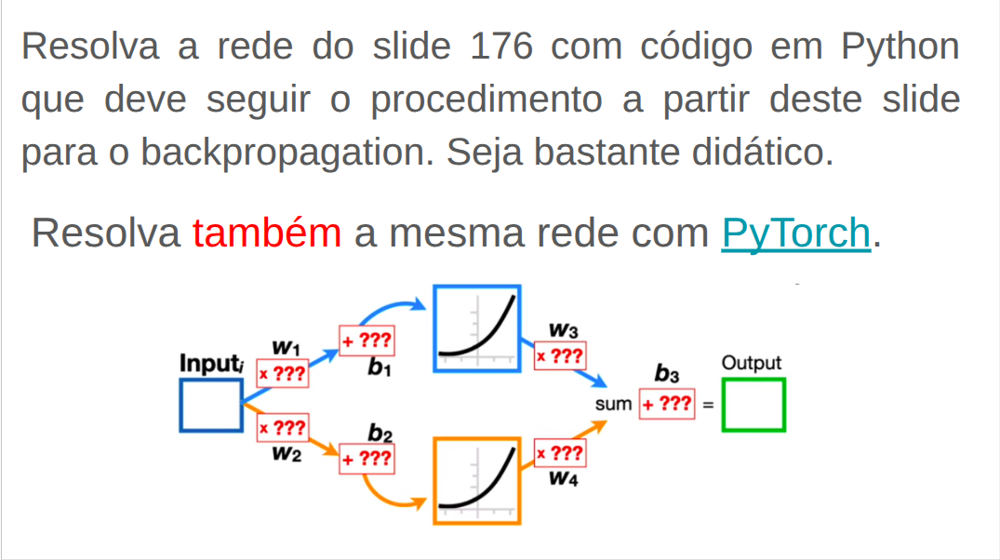

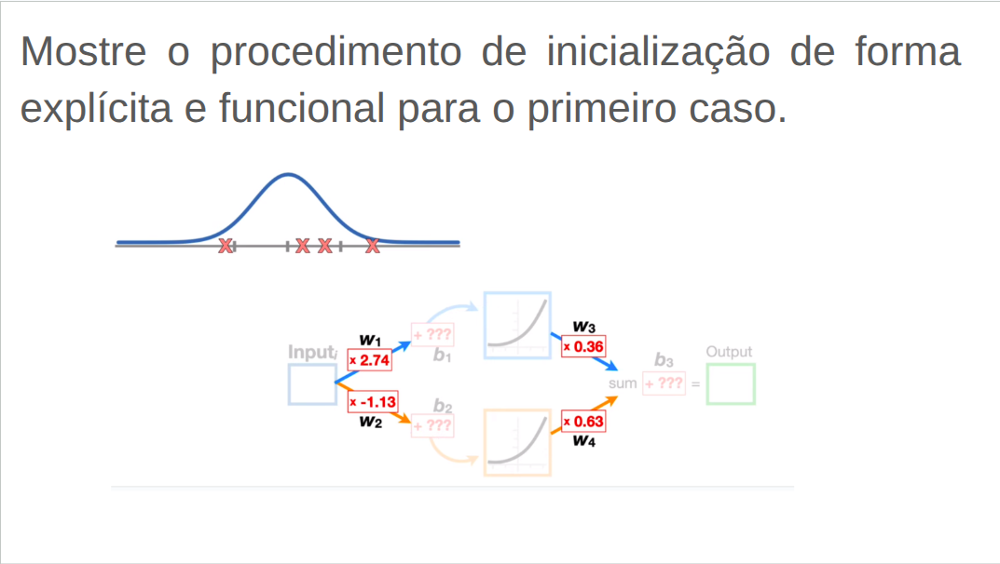

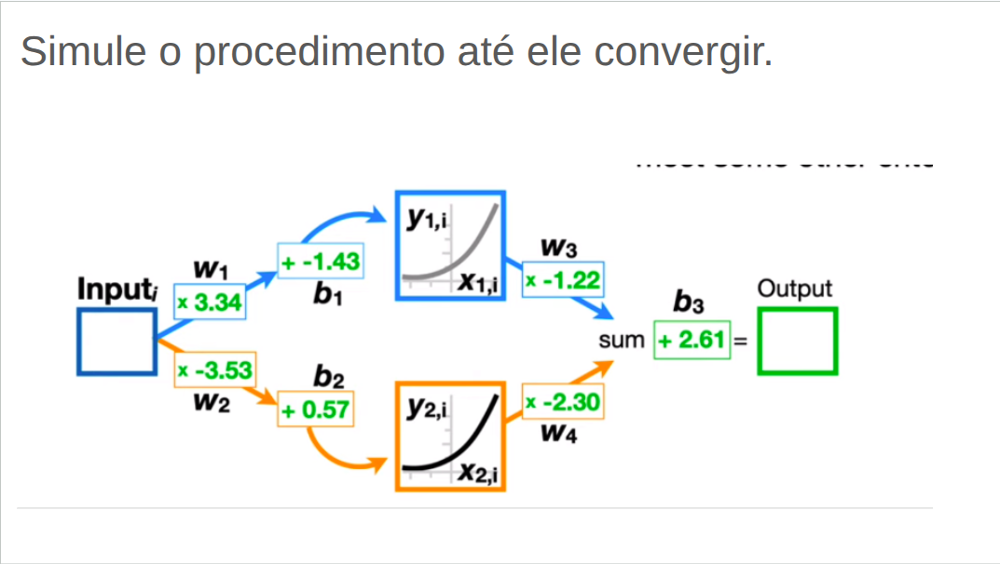

In [27]:
# Exibe a segunda imagem com largura ajustada
display(Image("/home/cassiosilva/Imagens/Tarefa 3.1/Atividade G.png", width=950))
print("")  # Espaço entre as imagens

# Exibe a segunda imagem com largura ajustada
display(Image("/home/cassiosilva/Imagens/Tarefa 3.1/Atividade G_2.png", width=950))
print("")  # Espaço entre as imagens

# Exibe a segunda imagem com largura ajustada
display(Image("/home/cassiosilva/Imagens/Tarefa 3.1/Atividade G_3.png", width=950))

In [28]:
# Importação das bibliotecas
import math
import random
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

In [30]:
# Função softplus e sua derivada (sigmoid)
def softplus(z):
    return math.log1p(math.exp(z))  # log(1 + exp(z))

def sigmoid(z):
    return 1 / (1 + math.exp(-z))

def plot_parameters_gaussian(w1, w2, b1, b2, w3, w4, b3, figsize=(12, 6), x_range=(-4, 4)):
    """
    Plota os parâmetros da rede neural sobre uma distribuição gaussiana N(0,1).
    
    Args:
        w1, w2, b1, b2, w3, w4, b3: Valores dos parâmetros da rede
        figsize: Tamanho da figura (padrão: (12, 6))
        x_range: Intervalo do eixo x (padrão: (-4, 4))
    """
    # Dicionário de parâmetros
    params = {
        'w1': w1,
        'w2': w2,
        'b1': b1,
        'b2': b2,
        'w3': w3,
        'w4': w4,
        'b3': b3
    }

    # Configuração da figura
    plt.figure(figsize=figsize)
    
    # Gerar distribuição normal
    x = np.linspace(x_range[0], x_range[1], 1000)
    y = norm.pdf(x, 0, 1)  # média 0, desvio padrão 1

    # Plotar distribuição normal
    plt.plot(x, y, 'k-', linewidth=2, label='N(0,1)')

    # Plotar cada parâmetro
    colors = plt.cm.tab10(np.linspace(0, 1, len(params)))
    for (name, value), color in zip(params.items(), colors):
        plt.scatter(value, norm.pdf(value, 0, 1), 
                   s=150, marker='x', color=color, linewidth=2, 
                   label=f'{name} = {value:.4f}')

    # Configurações do gráfico
    plt.title('Parâmetros Iniciais na Distribuição N(0,1)', fontsize=14)
    plt.xlabel('Valor do Parâmetro', fontsize=12)
    plt.ylabel('Densidade de Probabilidade', fontsize=12)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.axvline(0, color='gray', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()



Pesos e biases inicializados:
w1=0.9417, w2=-1.3966, b1=-0.6797, b2=0.3705, w3=-1.0163, w4=-0.0721, b3=0.1792



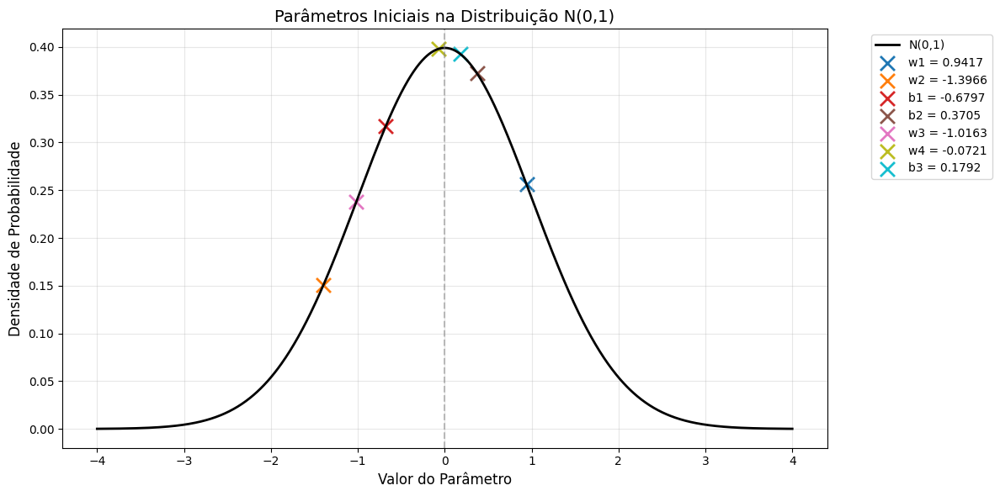

In [31]:
# Definindo a semente para reprodutibilidade
random.seed(0)  # Escolha qualquer número inteiro

# Inicialização dos parâmetros com distribuição Gaussiana média 0 e desvio padrão 1
w1 = random.gauss(0, 1)
w2 = random.gauss(0, 1)
b1 = random.gauss(0, 1)
b2 = random.gauss(0, 1)
w3 = random.gauss(0, 1)
w4 = random.gauss(0, 1)
b3 = random.gauss(0, 1)

# Exibindo os parâmetros iniciais
print(f"Pesos e biases inicializados:")
print(f"w1={w1:.4f}, w2={w2:.4f}, b1={b1:.4f}, b2={b2:.4f}, w3={w3:.4f}, w4={w4:.4f}, b3={b3:.4f}\n")

# Plotando os parâmetros sobre a distribuição gaussiana
plot_parameters_gaussian(w1, w2, b1, b2, w3, w4, b3)

# Dados de entrada e saída desejada
data = [
    (0.0, 0.0),
    (0.5, 1.0),
    (1.0, 0.0)
]

eta = 0.1  # taxa de aprendizado
epochs = 1500  # número de épocas

In [32]:
for epoch in range(epochs):
    total_loss = 0.0
    #print(f"Época {epoch+1}")
    for x, y_true in data:
        # Forward pass
        z1 = w1 * x + b1
        z2 = w2 * x + b2
        a1 = softplus(z1)
        a2 = softplus(z2)
        y = w3 * a1 + w4 * a2 + b3

        # Erro e perda
        e = y - y_true
        loss = 0.5 * e * e
        total_loss += loss

        # Gradientes camada saída
        dL_dy = e
        dL_dw3 = dL_dy * a1
        dL_dw4 = dL_dy * a2
        dL_db3 = dL_dy

        # Gradientes ativações camada oculta
        dL_da1 = dL_dy * w3
        dL_da2 = dL_dy * w4

        # Derivada softplus = sigmoid
        dL_dz1 = dL_da1 * sigmoid(z1)
        dL_dz2 = dL_da2 * sigmoid(z2)

        # Gradientes pesos e biases camada oculta
        dL_dw1 = dL_dz1 * x
        dL_db1 = dL_dz1
        dL_dw2 = dL_dz2 * x
        dL_db2 = dL_dz2

        # Atualização dos parâmetros
        w1 -= eta * dL_dw1
        b1 -= eta * dL_db1
        w2 -= eta * dL_dw2
        b2 -= eta * dL_db2
        w3 -= eta * dL_dw3
        w4 -= eta * dL_dw4
        b3 -= eta * dL_db3

        #print(f"  x={x:.2f}, y_true={y_true:.2f}, y_pred={y:.4f}, loss={loss:.4f}")
        #print(f"    w1={w1:.4f}, b1={b1:.4f}, w2={w2:.4f}, b2={b2:.4f}, w3={w3:.4f}, w4={w4:.4f}, b3={b3:.4f}")

    if (epoch + 1) % 100 == 0:   
        #print(f"Loss total da época: {total_loss:.4f}\n")
        print(f"\nÉpoca {epoch+1}")
        print(f"Parâmetros finais: w1={w1:.4f}, b1={b1:.4f}, w2={w2:.4f}, b2={b2:.4f}, w3={w3:.4f}, w4={w4:.4f}, b3={b3:.4f}")

print("\nSaídas com os pesos desejados:")
for x, y_true in data:
    z1 = w1 * x + b1
    z2 = w2 * x + b2
    a1 = softplus(z1)
    a2 = softplus(z2)
    y = w3 * a1 + w4 * a2 + b3
    print(f"x={x:.2f} → y_pred={y:.4f}, y_true={y_true}")


Época 100
Parâmetros finais: w1=0.8797, b1=-1.0016, w2=-1.5221, b2=0.2744, w3=-0.6652, w4=-0.3272, b3=0.8068

Época 200
Parâmetros finais: w1=1.1785, b1=-1.0619, w2=-1.7957, b2=0.1908, w3=-0.8158, w4=-0.5768, b3=1.0008

Época 300
Parâmetros finais: w1=1.6112, b1=-1.1610, w2=-2.2248, b2=0.1779, w3=-1.0307, w4=-0.9584, b3=1.3060

Época 400
Parâmetros finais: w1=2.1314, b1=-1.3383, w2=-2.8074, b2=0.3007, w3=-1.2867, w4=-1.4636, b3=1.7412

Época 500
Parâmetros finais: w1=2.5675, b1=-1.5331, w2=-3.3176, b2=0.4707, w3=-1.5129, w4=-1.8774, b3=2.1758

Época 600
Parâmetros finais: w1=2.7729, b1=-1.6398, w2=-3.5606, b2=0.5610, w3=-1.6244, w4=-2.0663, b3=2.4061

Época 700
Parâmetros finais: w1=2.8356, b1=-1.6744, w2=-3.6351, b2=0.5893, w3=-1.6591, w4=-2.1234, b3=2.4800

Época 800
Parâmetros finais: w1=2.8517, b1=-1.6834, w2=-3.6542, b2=0.5966, w3=-1.6681, w4=-2.1380, b3=2.4993

Época 900
Parâmetros finais: w1=2.8556, b1=-1.6856, w2=-3.6588, b2=0.5984, w3=-1.6703, w4=-2.1415, b3=2.5040

Época 100

In [ ]:
# Segundo metodo de resolução do problema

# Importando as bibliotecas 
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

In [34]:
# Dados e valores alvo
x_data = torch.tensor([[0.0], [0.5], [1.0]])
y_true = torch.tensor([[0.0], [1.0], [0.0]])

# Fixar semente para reprodutibilidade
torch.manual_seed(5)

In [35]:
# Função para plotar os parâmetros da rede na inicialização
def plot_parameters_gaussian(w1, w2, b1, b2, w3, w4, b3, figsize=(12, 6), x_range=(-4, 4)):
    """
    Plota os parâmetros da rede neural sobre uma distribuição gaussiana N(0,1).
    
    Args:
        w1, w2, b1, b2, w3, w4, b3: Valores dos parâmetros da rede
        figsize: Tamanho da figura (padrão: (12, 6))
        x_range: Intervalo do eixo x (padrão: (-4, 4))
    """
    # Dicionário de parâmetros
    params = {
        'w1': w1,
        'w2': w2,
        'b1': b1,
        'b2': b2,
        'w3': w3,
        'w4': w4,
        'b3': b3
    }

    # Configuração da figura
    plt.figure(figsize=figsize)
    
    # Gerar distribuição normal
    x = np.linspace(x_range[0], x_range[1], 1000)
    y = norm.pdf(x, 0, 1)  # média 0, desvio padrão 1

    # Plotar distribuição normal
    plt.plot(x, y, 'k-', linewidth=2, label='N(0,1)')

    # Plotar cada parâmetro
    colors = plt.cm.tab10(np.linspace(0, 1, len(params)))
    for (name, value), color in zip(params.items(), colors):
        plt.scatter(value, norm.pdf(value, 0, 1), 
                   s=150, marker='x', color=color, linewidth=2, 
                   label=f'{name} = {value:.4f}')

    # Configurações do gráfico
    plt.title('Parâmetros Iniciais na Distribuição N(0,1)', fontsize=14)
    plt.xlabel('Valor do Parâmetro', fontsize=12)
    plt.ylabel('Densidade de Probabilidade', fontsize=12)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.axvline(0, color='gray', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


Parâmetros iniciais:
w1: 2.0342, w2: -1.4134, b1: -0.7971, b2: -0.0833, w3: -0.4446, w4: -0.5018, b3: -0.2816


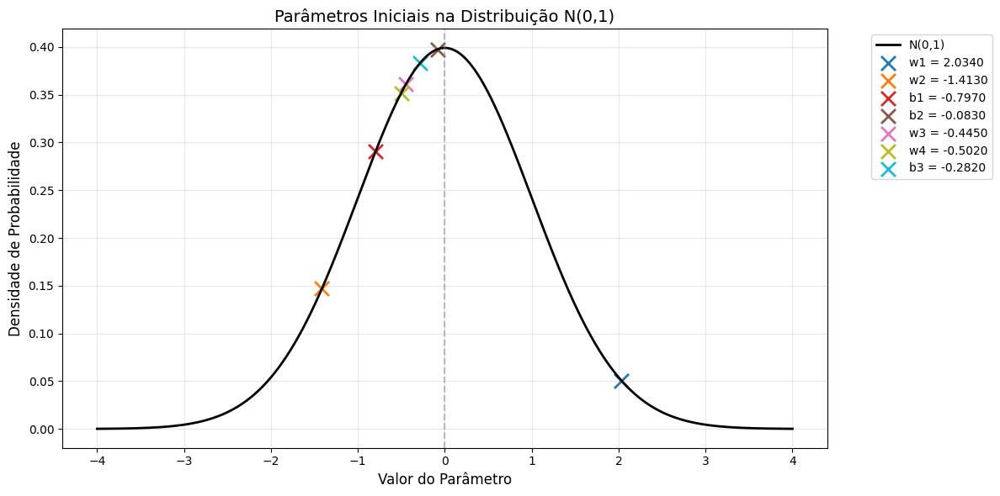


Epoch 0: loss = 1.679927
Parametros da rede: w1 = 1.9951367378234863, w2 = -1.429345726966858, b1 = -0.8583751916885376, b2 = -0.12121487408876419, w3 = -0.22262614965438843, w4 = -0.4084324836730957, b3 = -0.038288213312625885


Epoch 100: loss = 0.202343
Parametros da rede: w1 = 2.0153448581695557, w2 = -1.52899968624115, b1 = -0.9020625352859497, b2 = -0.16140995919704437, w3 = -0.2115011364221573, w4 = -0.3734928369522095, b3 = 0.6372737288475037


Epoch 200: loss = 0.184342
Parametros da rede: w1 = 2.086442708969116, w2 = -1.6931687593460083, b1 = -0.9643234610557556, b2 = -0.10606694966554642, w3 = -0.34576043486595154, w4 = -0.6518735885620117, b3 = 0.8492718935012817


Epoch 300: loss = 0.157073
Parametros da rede: w1 = 2.199589967727661, w2 = -1.9487416744232178, b1 = -1.0552599430084229, b2 = -0.015166793018579483, w3 = -0.5062947869300842, w4 = -0.9563937187194824, b3 = 1.0922428369522095


Epoch 400: loss = 0.117658
Parametros da rede: w1 = 2.366576671600342, w2 = -2.28597

In [36]:
# Rede
class SimpleNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.hidden = nn.Linear(1, 2)
        self.output = nn.Linear(2, 1)
        nn.init.normal_(self.hidden.weight, mean=0.0, std=1.0)
        nn.init.normal_(self.hidden.bias, mean=0.0, std=1.0)
        nn.init.normal_(self.output.weight, mean=0.0, std=1.0)
        nn.init.normal_(self.output.bias, mean=0.0, std=1.0)

        print("Parâmetros iniciais:")
        print(f"w1: {self.hidden.weight[0][0].item():.4f}, w2: {self.hidden.weight[1][0].item():.4f}, "
              f"b1: {self.hidden.bias[0].item():.4f}, b2: {self.hidden.bias[1].item():.4f}, "
              f"w3: {self.output.weight[0][0].item():.4f}, w4: {self.output.weight[0][1].item():.4f}, "
              f"b3: {self.output.bias[0].item():.4f}")
        
        plot_parameters_gaussian(round(self.hidden.weight[0][0].item(), 3),
                                 round(self.hidden.weight[1][0].item(), 3),
                                 round(self.hidden.bias[0].item(), 3),
                                 round(self.hidden.bias[1].item(), 3),
                                 round(self.output.weight[0][0].item(), 3),
                                 round(self.output.weight[0][1].item(), 3),
                                 round(self.output.bias[0].item(), 3)) 

    def forward(self, x):
        x = F.softplus(self.hidden(x))
        return self.output(x)

model = SimpleNN()
optimizer = optim.SGD(model.parameters(), lr=0.1)
criterion = nn.MSELoss()

def print_distances(model, target_params):
    with torch.no_grad():
        w1 = model.hidden.weight[0][0].item()
        w2 = model.hidden.weight[1][0].item()
        b1 = model.hidden.bias[0].item()
        b2 = model.hidden.bias[1].item()
        w3 = model.output.weight[0][0].item()
        w4 = model.output.weight[0][1].item()
        b3 = model.output.bias[0].item()

        print(f"Parametros da rede: w1 = {w1}, w2 = {w2}, b1 = {b1}, b2 = {b2}, w3 = {w3}, w4 = {w4}, b3 = {b3}")
        print()

# Treinamento
for epoch in range(1500):
    model.train()
    optimizer.zero_grad()
    y_pred = model(x_data)
    loss = criterion(y_pred, y_true)
    loss.backward()
    optimizer.step()

    if  epoch  % 100 == 0:
        print(f"\nEpoch {epoch}: loss = {loss.item():.6f}")
        print_distances(model, target_params)


# Teste final
model.eval()
with torch.no_grad():
    y_pred = model(x_data)
    print("\nPrevisões finais:")
    for i, x in enumerate(x_data):
        print(f"x = {x.item():.2f}, y_true = {y_true[i].item():.2f}, y_pred = {y_pred[i].item():.4f}")


### Conclusão
Conforme solicitado na questão, a rede foi inicializada com pesos extraídos de uma distribuição Gaussiana com média 0 e desvio padrão 1. Mesmo partindo de uma inicialização aleatória, os valores finais dos parâmetros se aproximaram bastante dos valores ótimos apresentados no final da questão.

A pequena diferença entre os resultados pode ser atribuída à variação na inicialização dos pesos, conhecida como “chute inicial” da rede, que influencia o caminho percorrido durante o treinamento. No entanto, esse fator não comprometeu o desempenho do modelo, já que, em ambos os métodos, a rede foi capaz de realizar previsões corretas, demonstrando estabilidade e boa capacidade de generalização.